In [ ]:
os.chdir('D:\Formations\Computer vision\projet\Detection-Reconnaissance-Matricules-Alg-riens')

## Step one : Car detection

### Tools : 
- Yolov3 model Tensorflow Converter
- Yolov3 Pretrained Model (on coco dataset)
- DeepSORT Algorithm to track cars 

In [ ]:
#Converting model 
conversion_command = 'python convert.py'
!{conversion_command}

In [ ]:
#Detecting + Tracking cars with yolov3 and DeepSORT
track_command = 'python object_tracker.py'
!{track_command}

## Step Two : Liscence Plate detection

### Tools : 
- Yolov4 model Tensorflow Converter
- Yolov4 Pretrained Model (on custumised Liscence Plate dataset)

In [ ]:
#convertir le model de detection des matricules yolov4
'''convert_command = 'python save_model.py --weights .data/yolov4_custom.weights ./checkpoints/yolov4-416 --input_size 416 --model yolov4'
!{convert_command}'''

In [1]:
import os
import PIL
#Importing the library
import matplotlib.pyplot as plt
import keras_ocr
import cv2

In [2]:
os.chdir('D:\Formations\Computer vision\projet\Detection-Reconnaissance-Matricules-Alg-riens\ObjectDetection') 

In [43]:
#faire la detection des matricules et copier dans un fichier de resultats
v1_images = '../data/images/v1'
destination_image = '../data/images/results'
destination_matricule = '../data/images/matricules'


for dirs, subdirs, files in os.walk(v1_images):
    for file in files:
        detect_command = f'python detect.py --weights ./checkpoints/yolov4-416 --size 416 --model yolov4 --image {v1_images}/{file} --output {destination_image}/{file} --mat {destination_matricule}/{file}'
        !{detect_command}


2022-08-07 16:46:33.350416: W tensorflow/stream_executor/platform/default/dso_loader.cc:59] Could not load dynamic library 'cudart64_101.dll'; dlerror: cudart64_101.dll not found
2022-08-07 16:46:33.350745: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-08-07 16:46:35.564727: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library nvcuda.dll
2022-08-07 16:46:36.005943: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1050 Ti computeCapability: 6.1
coreClock: 1.62GHz coreCount: 6 deviceMemorySize: 4.00GiB deviceMemoryBandwidth: 104.43GiB/s
2022-08-07 16:46:36.007063: W tensorflow/stream_executor/platform/default/dso_loader.cc:59] Could not load dynamic library 'cudart64_101.dll'; dlerror: cudart64_101.dll not found
2022-08-07 16:46:36.007925: W tensorflow/stream_executo

In [ ]:
#faire la detection des matricules et copier dans un fichier de resultats(sécurité)
v2_images ='../data/images/v2'


for  _, _, vfiles in os.walk(v2_images):
    for vfile in vfiles:
        if not os.path.isfile(f'{destination_matricule}/{vfile}'):
            detect_command = f'python detect.py --weights ./checkpoints/yolov4-416 --size 416 --model yolov4 --image {v2_images}/{vfile} --output {destination_image}/{vfile} --mat {destination_matricule}/{vfile}'
            !{detect_command}

2022-08-07 15:56:32.301640: W tensorflow/stream_executor/platform/default/dso_loader.cc:59] Could not load dynamic library 'cudart64_101.dll'; dlerror: cudart64_101.dll not found
2022-08-07 15:56:32.301968: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-08-07 15:56:34.466419: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library nvcuda.dll
2022-08-07 15:56:35.363378: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1050 Ti computeCapability: 6.1
coreClock: 1.62GHz coreCount: 6 deviceMemorySize: 4.00GiB deviceMemoryBandwidth: 104.43GiB/s
2022-08-07 15:56:35.364482: W tensorflow/stream_executor/platform/default/dso_loader.cc:59] Could not load dynamic library 'cudart64_101.dll'; dlerror: cudart64_101.dll not found
2022-08-07 15:56:35.365296: W tensorflow/stream_executo

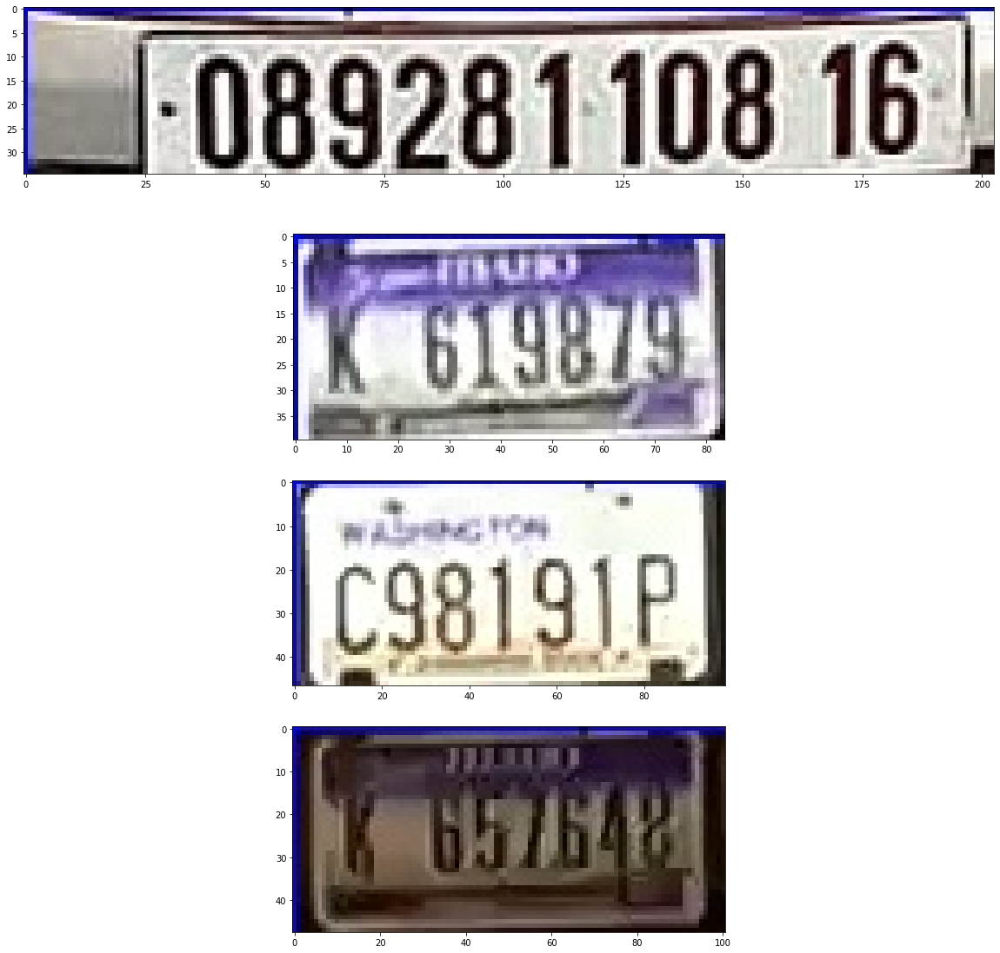

In [ ]:
# Plot les matricules 
numplots = len([name for name in os.listdir(destination_matricule)])
dirs, subdirs, files in os.walk(destination_matricule)

fig, axs = plt.subplots(nrows=numplots, figsize=(20, 20))
for dirs, subdirs, files in os.walk(destination_matricule):
    for ax, file in zip(axs,files):
        img = PIL.Image.open(f'{destination_matricule}/{file}')
        ax.imshow(img)


In [3]:
#Generating dataset for super resolution algorithm
img_source ='../SRGAN/original_images'
detected ='../SRGAN/detected'
hr_images = '../SRGAN/imgs'

for dirs, subdirs, files in os.walk(img_source):
    for file in files:
        detect_command = f'python detect.py --weights ./checkpoints/yolov4-416 --size 416 --model yolov4 --image {img_source}/{file} --output {detected}/{file} --mat {hr_images}/{file}'
        !{detect_command}


2022-08-08 12:48:11.131181: W tensorflow/stream_executor/platform/default/dso_loader.cc:59] Could not load dynamic library 'cudart64_101.dll'; dlerror: cudart64_101.dll not found
2022-08-08 12:48:11.131604: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-08-08 12:48:14.259770: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library nvcuda.dll
2022-08-08 12:48:15.264093: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1050 Ti computeCapability: 6.1
coreClock: 1.62GHz coreCount: 6 deviceMemorySize: 4.00GiB deviceMemoryBandwidth: 104.43GiB/s
2022-08-08 12:48:15.265819: W tensorflow/stream_executor/platform/default/dso_loader.cc:59] Could not load dynamic library 'cudart64_101.dll'; dlerror: cudart64_101.dll not found
2022-08-08 12:48:15.267080: W tensorflow/stream_executo

## Step Three : The super resolution

In [2]:
os.chdir('D:\Formations\Computer vision\projet\Detection-Reconnaissance-Matricules-Alg-riens\SRGAN')


In [5]:
#preparing dataset
data_prep_command = 'python dataset_prep.py' 
!{data_prep_command}

..\train_images\hr_images\im1.jpg
..\train_images\lr_images\im1.jpg
..\train_images\hr_images\im10.jpg
..\train_images\lr_images\im10.jpg
..\train_images\hr_images\im100.jpg
..\train_images\lr_images\im100.jpg
..\train_images\hr_images\im1000.jpg
..\train_images\lr_images\im1000.jpg
..\train_images\hr_images\im10000.jpg
..\train_images\lr_images\im10000.jpg
..\train_images\hr_images\im10001.jpg
..\train_images\lr_images\im10001.jpg
..\train_images\hr_images\im10002.jpg
..\train_images\lr_images\im10002.jpg
..\train_images\hr_images\im10003.jpg
..\train_images\lr_images\im10003.jpg
..\train_images\hr_images\im10004.jpg
..\train_images\lr_images\im10004.jpg
..\train_images\hr_images\im10005.jpg
..\train_images\lr_images\im10005.jpg
..\train_images\hr_images\im10006.jpg
..\train_images\lr_images\im10006.jpg
..\train_images\hr_images\im10007.jpg
..\train_images\lr_images\im10007.jpg
..\train_images\hr_images\im10008.jpg
..\train_images\lr_images\im10008.jpg
..\train_images\hr_images\im1000

In [4]:
#training SRGAN
train_command = 'python train.py'
!{train_command}

Figure(1200x600)
Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 32, 32, 64)   15616       input_1[0][0]                    
__________________________________________________________________________________________________
p_re_lu (PReLU)                 (None, 32, 32, 64)   64          conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 32, 32, 64)   36928       p_re_lu[0][0]                    
______________________________________________________________________

2022-08-15 22:44:59.657427: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library cudart64_101.dll
2022-08-15 22:45:02.930203: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library nvcuda.dll
2022-08-15 22:45:03.875160: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1050 Ti computeCapability: 6.1
coreClock: 1.62GHz coreCount: 6 deviceMemorySize: 4.00GiB deviceMemoryBandwidth: 104.43GiB/s
2022-08-15 22:45:03.875681: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library cudart64_101.dll
2022-08-15 22:45:03.944558: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library cublas64_10.dll
2022-08-15 22:45:03.976407: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library cufft64_1

In [5]:
os.getcwd()

'D:\\Formations\\Computer vision\\projet\\Detection-Reconnaissance-Matricules-Alg-riens\\SRGAN'

In [8]:
detect_command = 'python test.py' 
!{detect_command}

2022-08-15 22:53:43.964938: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library cudart64_101.dll
2022-08-15 22:53:46.884165: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library nvcuda.dll
2022-08-15 22:53:47.784773: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1050 Ti computeCapability: 6.1
coreClock: 1.62GHz coreCount: 6 deviceMemorySize: 4.00GiB deviceMemoryBandwidth: 104.43GiB/s
2022-08-15 22:53:47.785269: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library cudart64_101.dll
2022-08-15 22:53:47.792049: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library cublas64_10.dll
2022-08-15 22:53:47.795505: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library cufft64_1

## Step Four : Liscence Plate Recognition (OCR)

### Tools :
- Keras_OCR Python Library 
NB : 
- EasyOCR didn't show Gould results
- Tesseract isn't lightweight
- Paddle OCR is requires more updated dependences that do not work for other parts of the code
  

In [ ]:
# keras-ocr will automatically download pretrained
# weights for the detector and recognizer.
pipeline = keras_ocr.pipeline.Pipeline()
pipeline

Looking for C:\Users\Ranya BR\.keras-ocr\craft_mlt_25k.h5
Instructions for updating:
Create a `tf.sparse.SparseTensor` and use `tf.sparse.to_dense` instead.
Looking for C:\Users\Ranya BR\.keras-ocr\crnn_kurapan.h5


Change destimation matricule

In [ ]:
os.listdir(destination_matricule)

['11.jpg', 'Image1.jpg', 'Image2.jpg', 'Image3.jpg']

In [ ]:

#préparation des liens des images 
urls =[]
for file in os.listdir(destination_matricule):
    urls.append(os.path.join(destination_matricule, file))
urls

['../data/images/matricules\\11.jpg',
 '../data/images/matricules\\Image1.jpg',
 '../data/images/matricules\\Image2.jpg',
 '../data/images/matricules\\Image3.jpg']

In [ ]:
images = [
    keras_ocr.tools.read(url) for url in urls
]

In [ ]:

prediction_grp = pipeline.recognize(images)

In [ ]:
prediction_grp

[[('16',
   array([[166.,   6.],
          [193.,   6.],
          [193.,  33.],
          [166.,  33.]], dtype=float32)),
  ('081281108',
   array([[ 33.755447,   7.033101],
          [161.92578 ,   5.725251],
          [162.23    ,  35.53848 ],
          [ 34.05966 ,  36.84633 ]], dtype=float32))],
 [('glbs',
   array([[22., 11.],
          [81., 11.],
          [81., 32.],
          [22., 32.]], dtype=float32))],
 [('c1811',
   array([[ 6.2182612, 17.629013 ],
          [91.57433  , 13.996833 ],
          [92.6751   , 39.864883 ],
          [ 7.319031 , 43.497063 ]], dtype=float32))],
 []]

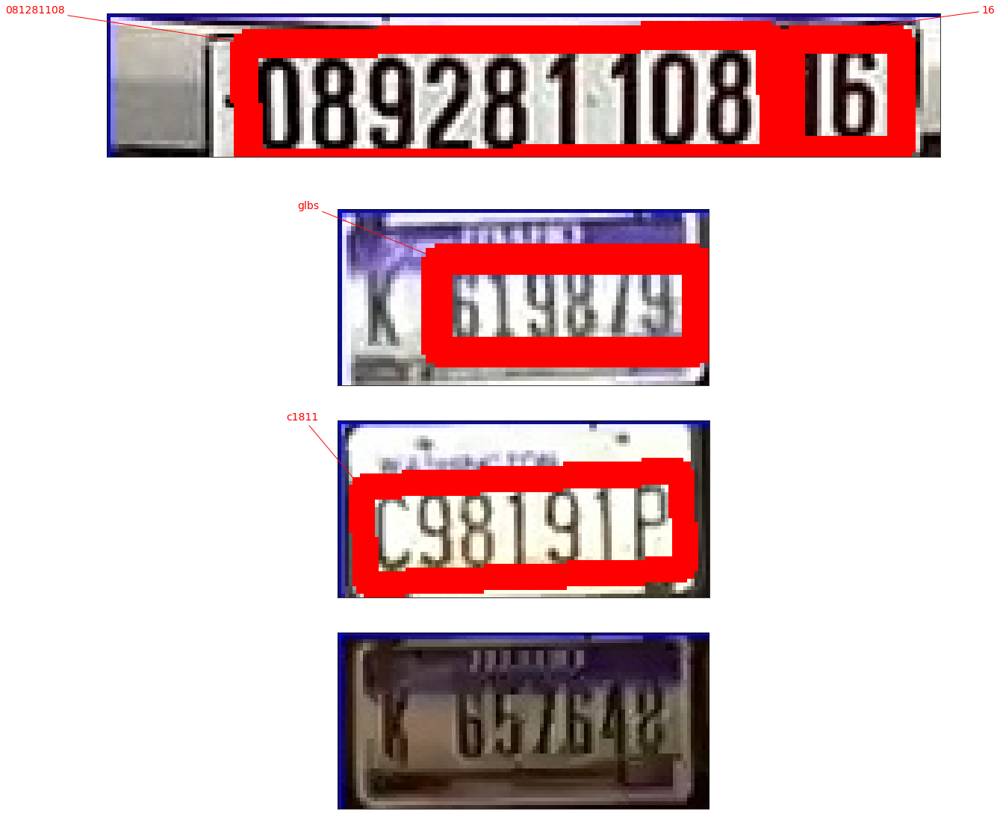

In [ ]:
# Plot the predictions
fig, axs = plt.subplots(nrows=len(images), figsize=(20, 20))
for ax, image, predictions in zip(axs, images, prediction_grp):
    keras_ocr.tools.drawAnnotations(image=image, predictions=predictions, ax=ax)

In [ ]:
prediction_grp[0]

[('16',
  array([[166.,   6.],
         [193.,   6.],
         [193.,  33.],
         [166.,  33.]], dtype=float32)),
 ('081281108',
  array([[ 33.755447,   7.033101],
         [161.92578 ,   5.725251],
         [162.23    ,  35.53848 ],
         [ 34.05966 ,  36.84633 ]], dtype=float32))]

In [ ]:
#extraction textuelle de toutes les prédictions
temp_str =""
myfile = open("../data/matricules.txt","a+")
preds = len(prediction_grp)
for j in range(preds):
    i = len(prediction_grp[j])
    while i>0:
        temp_str += prediction_grp[j][i-1][0]
        i-=1
    myfile.write(temp_str)
    myfile.write("\n")
    temp_str =""
myfile.close()

### DONE !!!!!!!!!